# Inference

This notebooks demonstrates various convolutional neural network (CNN) able to
segment UAV imagery into `ground`, `water`, and `building` classes. This process
is called *semantic segmentation*.

For the Python code used to train the models in this notebook, see
[train.ipynb](train.ipynb) instead.

The purpose of this functionality for the Lakehopper system is twofold:
- Provide awareness of the situation under the drone at the moment of flight
  ('in-situ'). This is as opposed to beforehand (when a certain dataset was
  captured or when the drone previously collected data). A lake might have dried
  up or a boat might be present where it wasn't previously.
- Provide a wide-area map based on orthographic imagery with features that are
  relevant to lakehopper. Other maps do not necessarily have the same feature
  definitions as lakehopper. The `water` class for Lakehopper refers to a body
  of surface water where autonomous landing is possible. Swamps or water
  obscured by bridges or vegetation do not fit this definition. They are however
  still classified as 'water' on most topographic maps.

{include-in-output}`/dissertation.pdf`
More information on everything from the model architecture to the motivation for
using a CNN can be found in my 2022 master's dissertation [*Autonomous Path Planning
and Landing Site Selection for Aquatic UAV*](/dissertation.pdf).
  
The dataset is too large to upload via cloud storage (58.6 GiB). Please contact
pieter@pfiers.net for a copy.

## Google Colaboratory Setup

Running in [Google Colab](https://colab.research.google.com/) is useful to
inspect the models and preview the dataset. To train the model however, a more
powerful runtime is necessary (like a GCE VPS with a TPU).

In [1]:
import sys
IN_COLAB = 'google.colab' in sys.modules
if IN_COLAB:
  sys.path.insert(0, "/content/drive/MyDrive/lh-train/lakehopper_semseg")
  from google.colab import drive
  drive.mount('/content/drive')

## Jupyter Notebook Setup

In [2]:
from env_utils import is_notebook, find_repo
from pathlib import Path
IS_NOTEBOOK = is_notebook()
REPO_ROOT = find_repo(Path.cwd())
if IS_NOTEBOOK:
    %load_ext autoreload
    %autoreload 2

## Imports

In [58]:
from datetime import datetime
from itertools import islice
import sys, os, csv, json, re

import numpy as np
from IPython.display import clear_output
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import tensorflow as tf
from tensorflow.keras.models import load_model

In [20]:
# Convenience methods
from visualize import show, imshow_rgb, imshow_mask
from tpu import resolve_tpu_strategy, get_tpu_devices
from dataset import load_dataset, single_hot_to_color_mask, split_dataset_paths, read_metadata, has_all_classes, single_hot_to_categorical, categorical_to_single_label_mask_tf, categorical_to_one_hot_label_mask
from masks import colorize_byte_mask
from augment import Augment
from models.create import create_model, compile_model
from models.f1score import F1Score
from preprocess.colormaps import IV_ORTHO_MID_LABEL_COLOR_MAP as COLOR_MAP, IV_ORTHO_BG_COLOR as BG_COLOR

## TPU Setup

In [5]:
USE_TPU = os.environ.get('USE_TPU', False)
if os.environ.get('USE_TPU', False):
  PARALLEL_OPS = tf.data.AUTOTUNE
  tpu_strategy = resolve_tpu_strategy('us-node')
  nbro_tpu_devices = len(get_tpu_devices())
  print(f"{nbro_tpu_devices} TPU devices connected!")
else:
  PARALLEL_OPS = None
  tpu_strategy = None

## Dataset Preparation

In [6]:
CLASSES = ["water", "building"]
IMAGE_SIZE = (224, 224)

In [7]:
if IN_COLAB:
    DATASET_FOLDER = "/content/drive/MyDrive/lh-train/tfr"
elif USE_TPU:
    DATASET_FOLDER = "gs://semseg-data-aggregated-1/tfr"
elif REPO_ROOT is not None:
    DATASET_FOLDER = str(REPO_ROOT / "vision/datasets/aggregated/tfr")
metadata_file_path = DATASET_FOLDER + "/metadata.json"
metadata = read_metadata(metadata_file_path)
TFR_PATTERN = DATASET_FOLDER + "/*.tfr"

if len(CLASSES) == 1:
    def should_include_chip(chip_classes):
        return all(class_ in chip_classes for class_ in CLASSES)
else:
    def should_include_chip(chip_classes):
        return any(class_ in chip_classes for class_ in CLASSES)

stem_nbro_label_pixels = metadata["nbroLabelPixels"]
applicable_chips = set()
for stem, nbro_label_pixels in stem_nbro_label_pixels.items():
    if should_include_chip(nbro_label_pixels.keys()):
        applicable_chips.add(stem)
tfr_paths = list(filter(
    lambda p: Path(p).stem in applicable_chips,
    tf.io.gfile.glob(TFR_PATTERN)
))

In [8]:
TRAIN_RATIO = 0.75
VALIDATION_RATIO = 0.22 # Remaining 8% is test
train_paths, validate_paths, test_paths = split_dataset_paths(tfr_paths, TRAIN_RATIO, VALIDATION_RATIO)
print(f"Found {len(tfr_paths)} tfrs. Splitting into {len(train_paths)} training, {len(validate_paths)} validation, and {len(test_paths)} test tfrs")

Found 2801 tfrs. Splitting into 2100 training, 616 validation, and 85 test tfrs


## Load Dataset

In [9]:
BATCH_SIZE = 64  # Using TPU v3-8 device => must be divisible by 8 for sharding
BUFFER_SIZE = 1000

def transform_mask(img, mask, weights = None):
    if len(CLASSES) == 1:
        mask_transformed = categorical_to_single_label_mask_tf(CLASSES.index("water") + 1, mask)
    else:
        mask_transformed = categorical_to_one_hot_label_mask(len(CLASSES) + 1, mask)
    
    if weights is None:
        return img, mask_transformed
    else:
        return img, categorical_to_one_hot_label_mask(len(CLASSES) + 1, mask), weights

test_dataset = (
    load_dataset(test_paths, IMAGE_SIZE, None)
    .map(transform_mask)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

2022-09-25 23:30:25.895008: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-25 23:30:25.895348: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-09-25 23:30:25.895439: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2022-09-25 23:30:25.895513: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2022-09-25 23:30:25.895583: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Co

## Create Model

In [10]:
INPUT_SHAPE = IMAGE_SIZE + (3,)
if IN_COLAB:
    # MODELS_FOLDER = "/content/drive/MyDrive/lh-train/tfr"
    assert(False)
elif USE_TPU:
    # MODELS_FOLDER = "gs://semseg-data-aggregated-1/tfr"
    assert(False)
elif REPO_ROOT is not None:
    MODELS_FOLDER = str(REPO_ROOT / "vision/models")

In [11]:
def create_and_compile(encoder, decoder):
    model = create_model(CLASSES, INPUT_SHAPE, encoder, decoder)
    model = compile_model(model, CLASSES)
    return model

def create_compile_and_load_model(encoder, decoder):
    if tpu_strategy is not None:
        with tpu_strategy.scope():
            model = create_and_compile(encoder, decoder)
    else:
        model = create_and_compile(encoder, decoder)

    model.load_weights(str(MODELS_FOLDER + f"/{decoder}_{encoder}_best.h5"))
    return model

In [12]:
encoder = os.environ.get('ENCODER', 'EfficientNetB3')
decoder = os.environ.get('DECODER', 'UNet')
model = create_compile_and_load_model(encoder, decoder)

print(f"Model created with encoder: {encoder} and decoder: {decoder}")
if IS_NOTEBOOK:
    model.summary()

Model created with encoder: EfficientNetB3 and decoder: UNet
Model: "UNet_EfficientNetB3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Resca

## Inference

In [13]:
def predict_single(image):
  prediction = model.predict(image[tf.newaxis, ...], verbose=0)[0]
  return single_hot_to_color_mask(prediction, CLASSES, COLOR_MAP, BG_COLOR)

def dataset_tuple_to_images(image, label):
  return (
    image,
    single_hot_to_color_mask(label, CLASSES, COLOR_MAP, BG_COLOR),
    tf.convert_to_tensor(predict_single(image))
  )

def show_predictions(dataset):
  show([dataset_tuple_to_images(image, label) for image, label in dataset])

Tensor("BroadcastTo:0", shape=(224, 224, 3), dtype=int32)


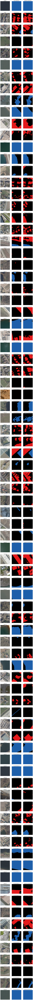

In [14]:
show_predictions(test_dataset)

## Multi-model inference

In [15]:
INFERENCE_MODEL_NAMES = [("FPN", "EfficientNetB3"), ("UNet", "EfficientNetB3"), ("FCN", "EfficientNetB3"), ("FCN", "MobileNetV2")]
inference_models = [create_compile_and_load_model(encoder, decoder) for decoder, encoder in INFERENCE_MODEL_NAMES]

Preprocessed input shape: (None, 224, 224, 3)


In [49]:
SAMPLE_IMAGE_INDICES = [83, 80, 63]
sample_images = [list(test_dataset)[i] for i in SAMPLE_IMAGE_INDICES]

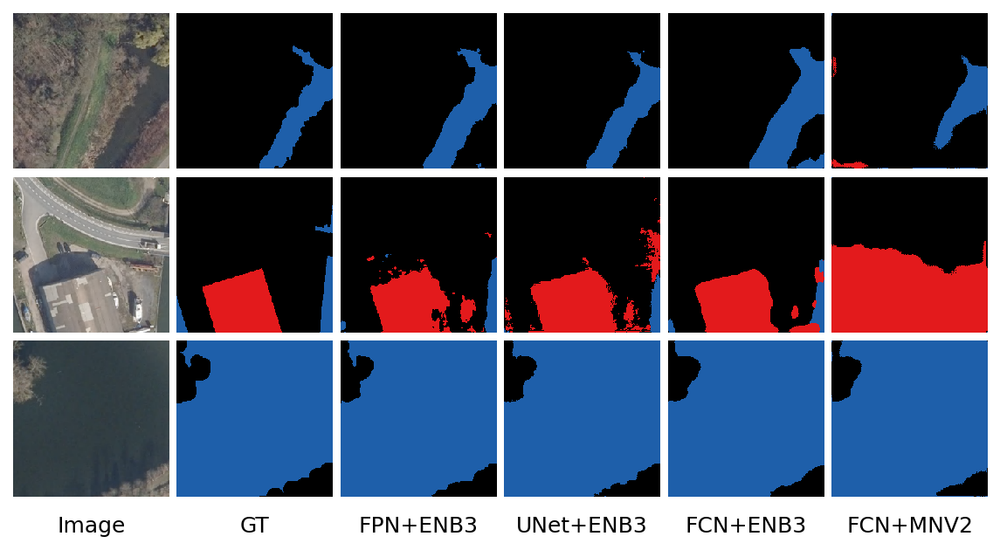

In [60]:
rows_cols = (len(sample_images), len(inference_models) + 2) # + 2 for image and label
fig, axes = plt.subplots(
    *rows_cols,
    dpi=150,
    gridspec_kw = {'wspace':0.05, 'hspace':0.05}
)
fig.set_figwidth(9.6)
TITLE_Y_OFFSET = -0.3

for i, (row, (image, label)) in enumerate(zip(axes, sample_images)):
    ax_image, ax_label, *ax_predictions = row
    imshow_rgb(ax_image, image)
    ax_image.axis("off")
    imshow_mask(ax_label, single_hot_to_color_mask(label, CLASSES, COLOR_MAP, BG_COLOR))
    ax_label.axis("off")
    if i == len(sample_images) - 1:
        ax_image.set_title("Image", y=TITLE_Y_OFFSET)
        ax_label.set_title("GT", y=TITLE_Y_OFFSET)
    for j, (ax, (decoder, encoder), model) in enumerate(zip(ax_predictions, INFERENCE_MODEL_NAMES, inference_models)):
        prediction = tf.convert_to_tensor(single_hot_to_color_mask(
            model.predict(image[tf.newaxis, ...], verbose=0)[0],
            CLASSES, COLOR_MAP, BG_COLOR
        ))
        imshow_mask(ax, prediction)
        ax.axis("off")
        if i == len(sample_images) - 1:
            ax.set_title(f"{decoder}+{re.sub(r'[a-z]', '', encoder)}", y=TITLE_Y_OFFSET)

plt.show()

## Metrics

In [70]:
ENCODERS = ("MobileNetV2", "InceptionResNetV2", "EfficientNetB3")
DECODERS = ("UNet", "FCN", "FPN")
models_train_metrics = {}
for encoder in ENCODERS:
    for decoder in DECODERS:
        with open(str(MODELS_FOLDER + f"/{decoder}_{encoder}_metrics.json"), "r") as f:
            models_train_metrics[(decoder, encoder)] = json.load(f)

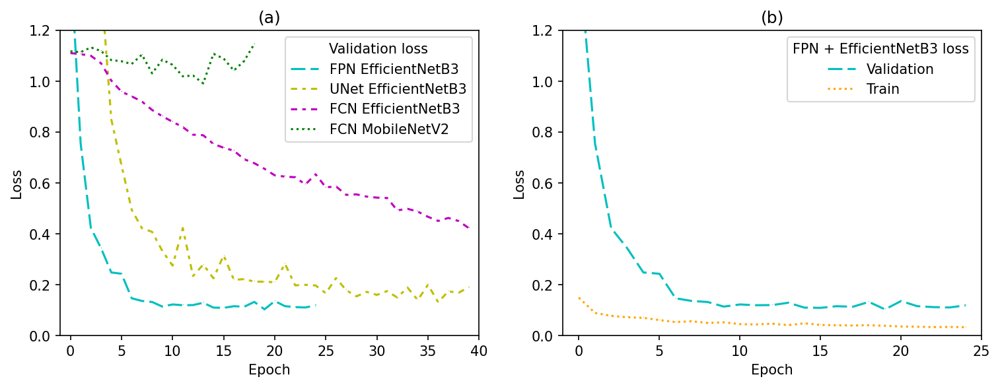

In [104]:
COLORS = ['c', 'y', 'm', 'g']
LINESTYLES = [(0, (7, 2.5)), (0, (3, 2.5, 1.7, 2.5)), (0, (3, 2.5, 1.7, 2.5)), (0, (1, 1.7))]
EPOCHS = list(range(0, 40))
VAL_TRAIN_LOSS_MODEL = ("FPN", "EfficientNetB3")
VAL_LOSS_MODELS = [("FPN", "EfficientNetB3"), ("UNet", "EfficientNetB3"), ("FCN", "EfficientNetB3"), ("FCN", "MobileNetV2")]


def ax_common(ax):
    ax.set_ylim(0, 1.2)
    ax.set_xlim(-1, 40)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')


def plot_all_val_loss(ax):
    ax.set_title('(a)')

    for i, (decoder, encoder) in enumerate(VAL_LOSS_MODELS):
        metrics = models_train_metrics[(decoder, encoder)]
        y = metrics["val_loss"]
        ax.plot(EPOCHS[:len(y)], y, label=f'{decoder} {encoder}', marker=',', color=COLORS[i], linestyle=LINESTYLES[i])

    ax.legend(loc='upper right', title='Validation loss')


def plot_val_train_loss(ax):
    ax.set_title('(b)')

    metrics = models_train_metrics[VAL_TRAIN_LOSS_MODEL]
    y_train = metrics["loss"]
    y_val = metrics["val_loss"]
    ax.set_xlim(-1, len(y_train))
    val_color = COLORS[0]
    val_linestyle = LINESTYLES[0]

    ax.plot(EPOCHS[:len(y_val)], y_val, color=val_color, marker=',', linestyle=val_linestyle, label='Validation')
    ax.plot(EPOCHS[:len(y_train)], y_train  , color='orange', marker=',', linestyle=(0, (1, 1.7)), label='Train')

    ax.legend(loc='upper right', title='FPN + EfficientNetB3 loss')


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), dpi=150)
ax_common(ax1)
ax_common(ax2)

plot_all_val_loss(ax1)
plot_val_train_loss(ax2)

plt.show()

In [ ]:
if IS_NOTEBOOK:
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

Create LaTeX table

In [74]:
out = """
\\begin{tabular}{c c c c c c c}
\t\\specialrule{.1em}{.1em}{.3em}
\tDecoder	& Encoder & Acc. & Precision & Recall & F1-score & MIoU \\\\
"""

for decoder in DECODERS:
    out += "\t\\specialrule{.05em}{.3em}{.3em}\n"
    for encoder_i, encoder in enumerate(ENCODERS):
        model_metrics = models_train_metrics[(decoder, encoder)]
        i_lowest_loss = np.argmin(model_metrics["val_loss"])
        print(f"Lowest loss for {decoder} {encoder} is at epoch {i_lowest_loss}")
        accuracy = to_str_2_dec(model_metrics['val_accuracy'][i_lowest_loss])
        precision = to_str_2_dec(model_metrics['val_precision_1'][i_lowest_loss])
        recall = to_str_2_dec(model_metrics['val_recall_1'][i_lowest_loss])
        f1_score = to_str_2_dec(model_metrics['val_f1-score'][i_lowest_loss])
        miou = to_str_2_dec(model_metrics['val_mean_iou'][i_lowest_loss])

        if encoder_i == len(ENCODERS) // 2:
            out += f"\t{decoder}\t"
        else:
            out += "\t\t\t"

        out += f"& {encoder.ljust(max(len(e) for e in ENCODERS))} & "
        out += f"{accuracy} & {precision} & {recall} & {f1_score} & {miou} \\\\\n"

out += """
\t\\specialrule{.1em}{.3em}{.1em}
\\end{tabular}
"""

print(out)


Lowest loss for UNet MobileNetV2 is at epoch 20
Lowest loss for UNet InceptionResNetV2 is at epoch 18
Lowest loss for UNet EfficientNetB3 is at epoch 36
Lowest loss for FCN MobileNetV2 is at epoch 13
Lowest loss for FCN InceptionResNetV2 is at epoch 35
Lowest loss for FCN EfficientNetB3 is at epoch 39
Lowest loss for FPN MobileNetV2 is at epoch 10
Lowest loss for FPN InceptionResNetV2 is at epoch 5
Lowest loss for FPN EfficientNetB3 is at epoch 19

\begin{tabular}{c c c c c c c}
	\specialrule{.1em}{.1em}{.3em}
	Decoder	& Encoder & Acc. & Precision & Recall & F1-score & MIoU \\
	\specialrule{.05em}{.3em}{.3em}
			& MobileNetV2       & 0.92 & 0.92 & 0.91 & 0.91 & 0.72 \\
	UNet	& InceptionResNetV2 & 0.94 & 0.94 & 0.94 & 0.94 & 0.77 \\
			& EfficientNetB3    & 0.96 & 0.96 & 0.95 & 0.96 & 0.81 \\
	\specialrule{.05em}{.3em}{.3em}
			& MobileNetV2       & 0.69 & 0.47 & 0.15 & 0.22 & 0.49 \\
	FCN	& InceptionResNetV2 & 0.92 & 0.93 & 0.90 & 0.92 & 0.75 \\
			& EfficientNetB3    & 0.95 & 0.96 & 0